<a href="https://colab.research.google.com/github/harrythedreamer/2023_sql_portfolio/blob/main/Delivery_Time_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# FOOD DELIVERY TIME PREDICTION

**1. Data Cleaning**

In [26]:
import pandas as pd
from google.colab import files
files.upload()

Saving train.csv to train (1).csv


{'train (1).csv': b'ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)\r\n0x4607 ,INDORES13DEL02 ,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,conditions Sunny,High ,2,Snack ,motorcycle ,0,No ,Urban ,(min) 24\r\n0xb379 ,BANGRES18DEL02 ,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,conditions Stormy,Jam ,2,Snack ,scooter ,1,No ,Metropolitian ,(min) 33\r\n0x5d6d ,BANGRES19DEL01 ,23,4.4,12.914264,77.6784,12.924264,77.6884,19-03-2022,08:30:00,08:45:00,conditions Sandstorms,Low ,0,Drinks ,motorcycle ,1,No ,Urban ,(min) 26\r\n0x7a6a ,COIMBRES13DEL02 ,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,conditions Sunny,Medium

In [27]:
df_train = pd.read_csv('train.csv')
df_train.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
0,0x4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,conditions Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,conditions Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,08:45:00,conditions Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,conditions Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,13:45:00,conditions Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30


In [28]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45593 entries, 0 to 45592
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           45593 non-null  object 
 1   Delivery_person_ID           45593 non-null  object 
 2   Delivery_person_Age          45593 non-null  object 
 3   Delivery_person_Ratings      45593 non-null  object 
 4   Restaurant_latitude          45593 non-null  float64
 5   Restaurant_longitude         45593 non-null  float64
 6   Delivery_location_latitude   45593 non-null  float64
 7   Delivery_location_longitude  45593 non-null  float64
 8   Order_Date                   45593 non-null  object 
 9   Time_Orderd                  45593 non-null  object 
 10  Time_Order_picked            45593 non-null  object 
 11  Weatherconditions            45593 non-null  object 
 12  Road_traffic_density         45593 non-null  object 
 13  Vehicle_conditio

In [29]:
df_train.duplicated().sum()

0

In [30]:
df_train.isnull().sum()

ID                             0
Delivery_person_ID             0
Delivery_person_Age            0
Delivery_person_Ratings        0
Restaurant_latitude            0
Restaurant_longitude           0
Delivery_location_latitude     0
Delivery_location_longitude    0
Order_Date                     0
Time_Orderd                    0
Time_Order_picked              0
Weatherconditions              0
Road_traffic_density           0
Vehicle_condition              0
Type_of_order                  0
Type_of_vehicle                0
multiple_deliveries            0
Festival                       0
City                           0
Time_taken(min)                0
dtype: int64

In [31]:
unique_values = {}
for column in df_train.columns:
    unique_values[column] = df_train[column].value_counts().index

# Print unique values
for column, values in unique_values.items():
    print(f"Unique values of {column}:", values)

Unique values of ID: Index(['0x4607 ', '0x1f3e ', '0xe251 ', '0x3f31 ', '0x4a78 ', '0xa16d ',
       '0xa561 ', '0xa9a5 ', '0x415e ', '0x9b31 ',
       ...
       '0x8b0 ', '0x8537 ', '0x47df ', '0x2947 ', '0x4102 ', '0xc3f1 ',
       '0x5db7 ', '0x1985 ', '0xceda ', '0x5fb2 '],
      dtype='object', length=45593)
Unique values of Delivery_person_ID: Index(['PUNERES01DEL01 ', 'JAPRES11DEL02 ', 'HYDRES04DEL02 ', 'JAPRES03DEL01 ',
       'VADRES11DEL02 ', 'RANCHIRES02DEL01 ', 'VADRES08DEL02 ',
       'INDORES15DEL01 ', 'RANCHIRES02DEL02 ', 'BANGRES07DEL02 ',
       ...
       'DEHRES12DEL03 ', 'BHPRES11DEL03 ', 'BHPRES15DEL03 ', 'AURGRES13DEL03 ',
       'GOARES01DEL03 ', 'DEHRES18DEL03 ', 'AURGRES11DEL03 ', 'KOLRES09DEL03 ',
       'KOCRES16DEL03 ', 'BHPRES010DEL03 '],
      dtype='object', length=1320)
Unique values of Delivery_person_Age: Index(['35', '36', '37', '30', '38', '24', '32', '22', '29', '33', '28', '25',
       '34', '26', '21', '27', '39', '20', '31', '23', 'NaN ', '50', 

❌ Some null values are identified: 'NaN ' as a string

In [32]:
def transform_null(data):

  data = data.copy()

  data.replace('NaN ', pd.NA, inplace=True)
  data['Weatherconditions'].replace('conditions NaN', pd.NA, inplace=True)

  return data

df_train2 = transform_null(df_train)

In [33]:
df_train2.isna().sum()

ID                                0
Delivery_person_ID                0
Delivery_person_Age            1854
Delivery_person_Ratings        1908
Restaurant_latitude               0
Restaurant_longitude              0
Delivery_location_latitude        0
Delivery_location_longitude       0
Order_Date                        0
Time_Orderd                    1731
Time_Order_picked                 0
Weatherconditions               616
Road_traffic_density            601
Vehicle_condition                 0
Type_of_order                     0
Type_of_vehicle                   0
multiple_deliveries             993
Festival                        228
City                           1200
Time_taken(min)                   0
dtype: int64

In [34]:
def transform_dataframe(data):

  data['Delivery_person_Age'] = pd.to_numeric(data['Delivery_person_Age'], errors='coerce')
  data['Delivery_person_Ratings'] = pd.to_numeric(data['Delivery_person_Ratings'], errors='coerce')
  data['Vehicle_condition'] = pd.to_numeric(data['Vehicle_condition'], errors='coerce')
  data['multiple_deliveries'] = pd.to_numeric(data['multiple_deliveries'], errors='coerce')

  data = data.rename(columns={'Time_Orderd': 'Time_Ordered'})

  data['Order_Date'] = pd.to_datetime(data['Order_Date']).dt.date
  data['Time_Ordered'] = pd.to_datetime(data['Time_Ordered']).dt.time
  data['Time_Order_picked'] = pd.to_datetime(data['Time_Order_picked']).dt.time

  data['Weatherconditions'] = data['Weatherconditions'].str.replace('conditions ','', regex=False)

  data['Time_taken(min)'] = pd.to_numeric(data['Time_taken(min)'].str.extract(r'(\d+)', expand=False), errors='coerce')

  from geopy.distance import geodesic
  def calculate_distance(row):
    restaurant_coords = (row['Restaurant_latitude'], row['Restaurant_longitude'])
    delivery_coords = (row['Delivery_location_latitude'], row['Delivery_location_longitude'])
    distance = geodesic(restaurant_coords, delivery_coords).kilometers
    return distance

  data['distance(km)'] = data.apply(calculate_distance, axis=1)

  data.dropna(subset=['Time_Ordered'], inplace=True)

  data['Pick_date'] = data.apply(
      lambda row: row['Order_Date'] + pd.DateOffset(1)
      if pd.notna(row['Time_Ordered']) > pd.notna(row['Time_Order_picked'])
      else row['Order_Date'], axis=1)

  data['Datetime_Ordered'] = pd.to_datetime(data['Order_Date'].astype(str) + ' ' + data['Time_Ordered'].astype(str))
  data['Datetime_Picked'] = pd.to_datetime(data['Pick_date'].astype(str) + ' ' + data['Time_Order_picked'].astype(str))

  data['Time_Order_prepared'] = (data['Datetime_Picked'] - data['Datetime_Ordered']).dt.total_seconds() / 60.0


  data['Ordered_hour'] = data['Datetime_Ordered'].apply(lambda x: x.hour)
  data['Ordered_minute'] = data['Datetime_Ordered'].apply(lambda x: x.minute)
  data['Picked_hour'] = data['Datetime_Picked'].apply(lambda x: x.hour)
  data['Picked_minute'] = data['Datetime_Picked'].apply(lambda x: x.minute)

  data['Order_day'] = data['Datetime_Ordered'].dt.day
  data['Order_month'] = data['Datetime_Ordered'].dt.month
  data['Order_weekdate'] = data['Datetime_Ordered'].dt.day_name()

  return data

df_train3 = transform_dataframe(df_train2)
df_train3.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Ordered,...,Datetime_Ordered,Datetime_Picked,Time_Order_prepared,Ordered_hour,Ordered_minute,Picked_hour,Picked_minute,Order_day,Order_month,Order_weekdate
0,0x4607,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,11:30:00,...,2022-03-19 11:30:00,2022-03-19 11:45:00,15.0,11,30,11,45,19,3,Saturday
1,0xb379,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,19:45:00,...,2022-03-25 19:45:00,2022-03-25 19:50:00,5.0,19,45,19,50,25,3,Friday
2,0x5d6d,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,08:30:00,...,2022-03-19 08:30:00,2022-03-19 08:45:00,15.0,8,30,8,45,19,3,Saturday
3,0x7a6a,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,2022-05-04,18:00:00,...,2022-05-04 18:00:00,2022-05-04 18:10:00,10.0,18,0,18,10,4,5,Wednesday
4,0x70a2,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,13:30:00,...,2022-03-26 13:30:00,2022-03-26 13:45:00,15.0,13,30,13,45,26,3,Saturday


In [35]:
def transform_dataframe_without_target(data):

  data['Delivery_person_Age'] = pd.to_numeric(data['Delivery_person_Age'], errors='coerce')
  data['Delivery_person_Ratings'] = pd.to_numeric(data['Delivery_person_Ratings'], errors='coerce')
  data['Vehicle_condition'] = pd.to_numeric(data['Vehicle_condition'], errors='coerce')
  data['multiple_deliveries'] = pd.to_numeric(data['multiple_deliveries'], errors='coerce')

  data = data.rename(columns={'Time_Orderd': 'Time_Ordered'})

  data['Order_Date'] = pd.to_datetime(data['Order_Date']).dt.date
  data['Time_Ordered'] = pd.to_datetime(data['Time_Ordered']).dt.time
  data['Time_Order_picked'] = pd.to_datetime(data['Time_Order_picked']).dt.time

  data['Weatherconditions'] = data['Weatherconditions'].str.replace('conditions ','', regex=False)

  from geopy.distance import geodesic
  def calculate_distance(row):
    restaurant_coords = (row['Restaurant_latitude'], row['Restaurant_longitude'])
    delivery_coords = (row['Delivery_location_latitude'], row['Delivery_location_longitude'])
    distance = geodesic(restaurant_coords, delivery_coords).kilometers
    return distance

  data['distance(km)'] = data.apply(calculate_distance, axis=1)

  data.dropna(subset=['Time_Ordered'], inplace=True)

  data['Pick_date'] = data.apply(
      lambda row: row['Order_Date'] + pd.DateOffset(1)
      if pd.notna(row['Time_Ordered']) > pd.notna(row['Time_Order_picked'])
      else row['Order_Date'], axis=1)

  data['Datetime_Ordered'] = pd.to_datetime(data['Order_Date'].astype(str) + ' ' + data['Time_Ordered'].astype(str))
  data['Datetime_Picked'] = pd.to_datetime(data['Pick_date'].astype(str) + ' ' + data['Time_Order_picked'].astype(str))

  data['Time_Order_prepared'] = (data['Datetime_Picked'] - data['Datetime_Ordered']).dt.total_seconds() / 60.0


  data['Ordered_hour'] = data['Datetime_Ordered'].apply(lambda x: x.hour)
  data['Ordered_minute'] = data['Datetime_Ordered'].apply(lambda x: x.minute)
  data['Picked_hour'] = data['Datetime_Picked'].apply(lambda x: x.hour)
  data['Picked_minute'] = data['Datetime_Picked'].apply(lambda x: x.minute)

  data['Order_day'] = data['Datetime_Ordered'].dt.day
  data['Order_month'] = data['Datetime_Ordered'].dt.month
  data['Order_weekdate'] = data['Datetime_Ordered'].dt.day_name()

  return data

In [36]:
df_train3.isna().sum()

ID                                0
Delivery_person_ID                0
Delivery_person_Age             214
Delivery_person_Ratings         268
Restaurant_latitude               0
Restaurant_longitude              0
Delivery_location_latitude        0
Delivery_location_longitude       0
Order_Date                        0
Time_Ordered                      0
Time_Order_picked                 0
Weatherconditions                 0
Road_traffic_density              0
Vehicle_condition                 0
Type_of_order                     0
Type_of_vehicle                   0
multiple_deliveries             943
Festival                        219
City                           1144
Time_taken(min)                   0
distance(km)                      0
Pick_date                         0
Datetime_Ordered                  0
Datetime_Picked                   0
Time_Order_prepared               0
Ordered_hour                      0
Ordered_minute                    0
Picked_hour                 

In [37]:
df_train3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43862 entries, 0 to 45592
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   ID                           43862 non-null  object        
 1   Delivery_person_ID           43862 non-null  object        
 2   Delivery_person_Age          43648 non-null  float64       
 3   Delivery_person_Ratings      43594 non-null  float64       
 4   Restaurant_latitude          43862 non-null  float64       
 5   Restaurant_longitude         43862 non-null  float64       
 6   Delivery_location_latitude   43862 non-null  float64       
 7   Delivery_location_longitude  43862 non-null  float64       
 8   Order_Date                   43862 non-null  object        
 9   Time_Ordered                 43862 non-null  object        
 10  Time_Order_picked            43862 non-null  object        
 11  Weatherconditions            43862 non-nu

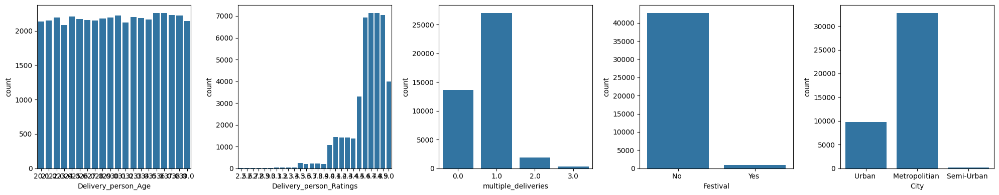

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the matplotlib figure with subplots
fig, axes = plt.subplots(1, 5, figsize=(20, 4))

sns.countplot(data=df_train3, x='Delivery_person_Age', ax=axes[0])
sns.countplot(data=df_train3, x='Delivery_person_Ratings', ax=axes[1])
sns.countplot(data=df_train3, x='multiple_deliveries', ax=axes[2])
sns.countplot(data=df_train3, x='Festival', ax=axes[3])
sns.countplot(data=df_train3, x='City', ax=axes[4])

plt.tight_layout()
plt.show()

In [39]:
columns_fill_mean = ['Delivery_person_Age', 'Delivery_person_Ratings']
columns_fill_mode = ['multiple_deliveries', 'Festival', 'City']

def transform_fill_null(data):

  data = data.copy()

  for column in columns_fill_mean:
    mean_value = data[column].mean()
    data[column].fillna(mean_value, inplace=True)

  for column in columns_fill_mode:
    mode_value = data[column].mode().iloc[0]
    data[column].fillna(mode_value, inplace=True)

  return data

df_train4 = transform_fill_null(df_train3)
df_train4.isna().sum()

ID                             0
Delivery_person_ID             0
Delivery_person_Age            0
Delivery_person_Ratings        0
Restaurant_latitude            0
Restaurant_longitude           0
Delivery_location_latitude     0
Delivery_location_longitude    0
Order_Date                     0
Time_Ordered                   0
Time_Order_picked              0
Weatherconditions              0
Road_traffic_density           0
Vehicle_condition              0
Type_of_order                  0
Type_of_vehicle                0
multiple_deliveries            0
Festival                       0
City                           0
Time_taken(min)                0
distance(km)                   0
Pick_date                      0
Datetime_Ordered               0
Datetime_Picked                0
Time_Order_prepared            0
Ordered_hour                   0
Ordered_minute                 0
Picked_hour                    0
Picked_minute                  0
Order_day                      0
Order_mont

In [40]:
columns_to_keep = [
    'Delivery_person_Age'
    , 'Delivery_person_Ratings'
    , 'Order_day'
    , 'Order_month'
    , 'Order_weekdate'
    , 'Ordered_hour'
    , 'Ordered_minute'
    , 'Picked_hour'
    , 'Picked_minute'
    , 'Time_Order_prepared'
    , 'distance(km)'
    , 'Type_of_order'
    , 'Type_of_vehicle'
    , 'multiple_deliveries'
    , 'City'
    , 'Festival'
    , 'Weatherconditions'
    , 'Road_traffic_density'
    , 'Vehicle_condition'
    , 'Time_taken(min)'
]

df_train5 = df_train4[columns_to_keep]
df_train5.head()

,Delivery_person_Age,Delivery_person_Ratings,Order_day,Order_month,Order_weekdate,Ordered_hour,Ordered_minute,Picked_hour,Picked_minute,Time_Order_prepared,distance(km),Type_of_order,Type_of_vehicle,multiple_deliveries,City,Festival,Weatherconditions,Road_traffic_density,Vehicle_condition,Time_taken(min)
0,37.0,4.9,19,3,Saturday,11,30,11,45,15.0,3.020737,Snack,motorcycle,0.0,Urban,No,Sunny,High,2,24
1,34.0,4.5,25,3,Friday,19,45,19,50,5.0,20.143737,Snack,scooter,1.0,Metropolitian,No,Stormy,Jam,2,33
2,23.0,4.4,19,3,Saturday,8,30,8,45,15.0,1.549693,Drinks,motorcycle,1.0,Urban,No,Sandstorms,Low,0,26
3,38.0,4.7,4,5,Wednesday,18,0,18,10,10.0,7.774497,Buffet,motorcycle,1.0,Metropolitian,No,Sunny,Medium,0,21
4,32.0,4.6,26,3,Saturday,13,30,13,45,15.0,6.197898,Snack,scooter,1.0,Metropolitian,No,Cloudy,High,1,30


In [41]:
columns_to_keep_without_target = [
    'Delivery_person_Age'
    , 'Delivery_person_Ratings'
    , 'Order_day'
    , 'Order_month'
    , 'Order_weekdate'
    , 'Ordered_hour'
    , 'Ordered_minute'
    , 'Picked_hour'
    , 'Picked_minute'
    , 'Time_Order_prepared'
    , 'distance(km)'
    , 'Type_of_order'
    , 'Type_of_vehicle'
    , 'multiple_deliveries'
    , 'City'
    , 'Festival'
    , 'Weatherconditions'
    , 'Road_traffic_density'
    , 'Vehicle_condition'
]

In [42]:
target = 'Time_taken(min)'

numeric_features = [
    'Delivery_person_Age'
    , 'Delivery_person_Ratings'
    , 'Order_day'
    , 'Order_month'
    , 'Ordered_hour'
    , 'Ordered_minute'
    , 'Picked_hour'
    , 'Picked_minute'
    , 'Time_Order_prepared'
    , 'distance(km)'
    , 'multiple_deliveries'
    , 'Vehicle_condition'
]

categorical_features = list(df_train5.drop(columns=numeric_features + [target], axis=1).columns)

**2. Exploratory Data Analysis**

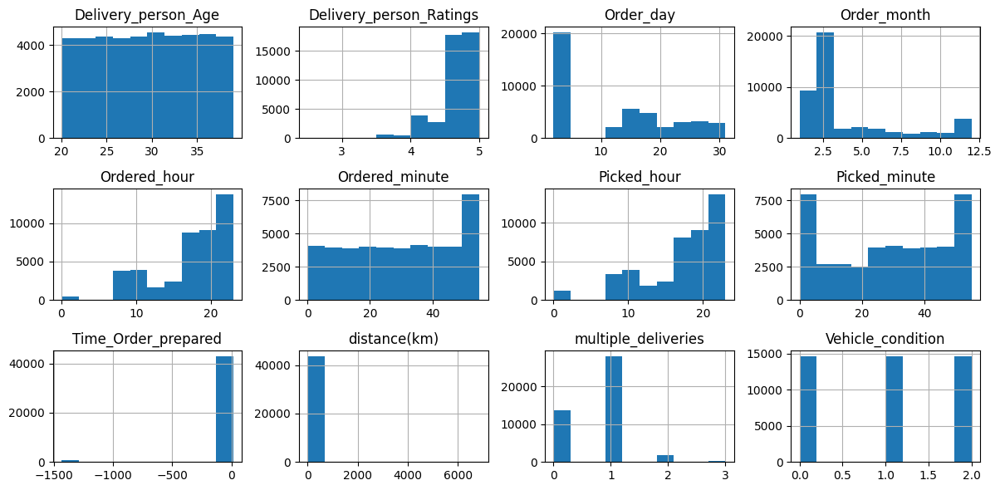

In [43]:
df_train5[numeric_features].hist(layout=(3,4), figsize=(12,6))
plt.tight_layout()

<Axes: xlabel='distance(km)'>

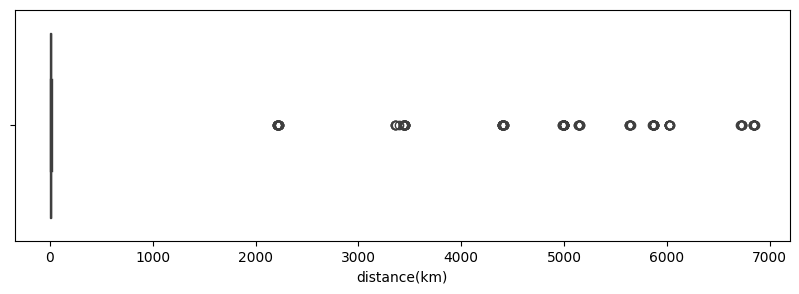

In [44]:
plt.figure(figsize=(10,3))
sns.boxplot(x=df_train5['distance(km)'])

<Axes: xlabel='distance(km)', ylabel='Time_taken(min)'>

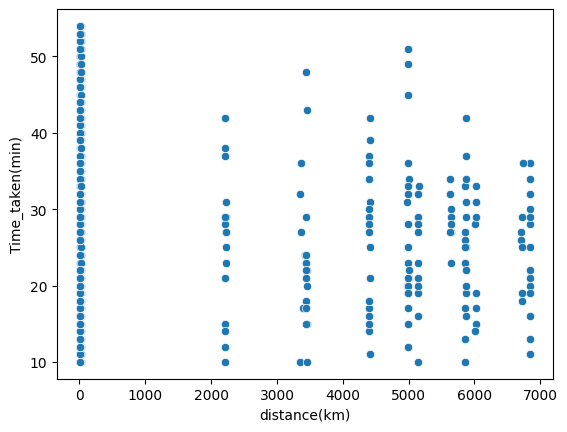

In [82]:
sns.scatterplot(x='distance(km)', y='Time_taken(min)', data=df_train5)

❌ Delivering food over a distance of 2000 km in less than an hour using two-wheelers is an impractical and unrealistic proposition.

In [45]:
def transform_outliers(data):
  data = data[data['Time_Order_prepared'] > 0]
  data = data[data['distance(km)'] < 1000]
  return data

df_train6 = transform_outliers(df_train5)

**Plotting histogram of numeric variables**

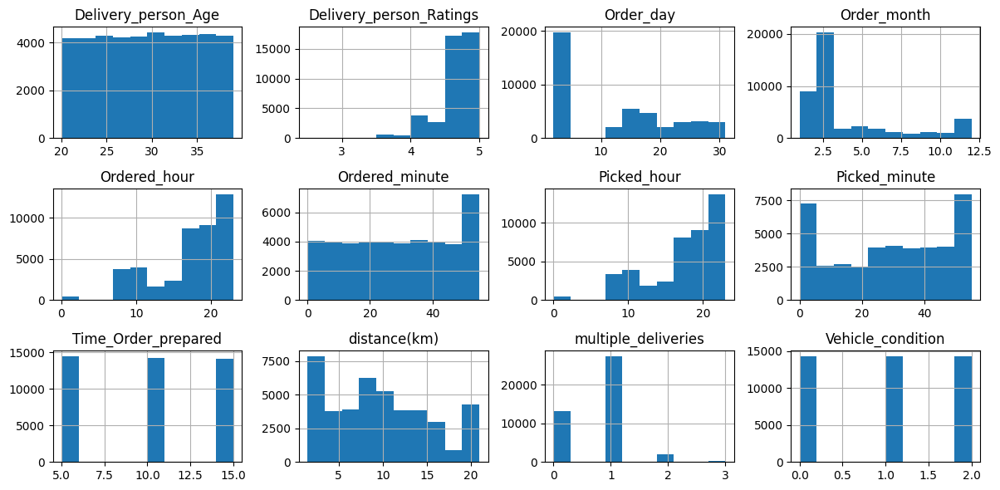

In [46]:
df_train6[numeric_features].hist(layout=(3,4), figsize=(12,6))
plt.tight_layout()

**Checking the correlation between numeric variables and target**

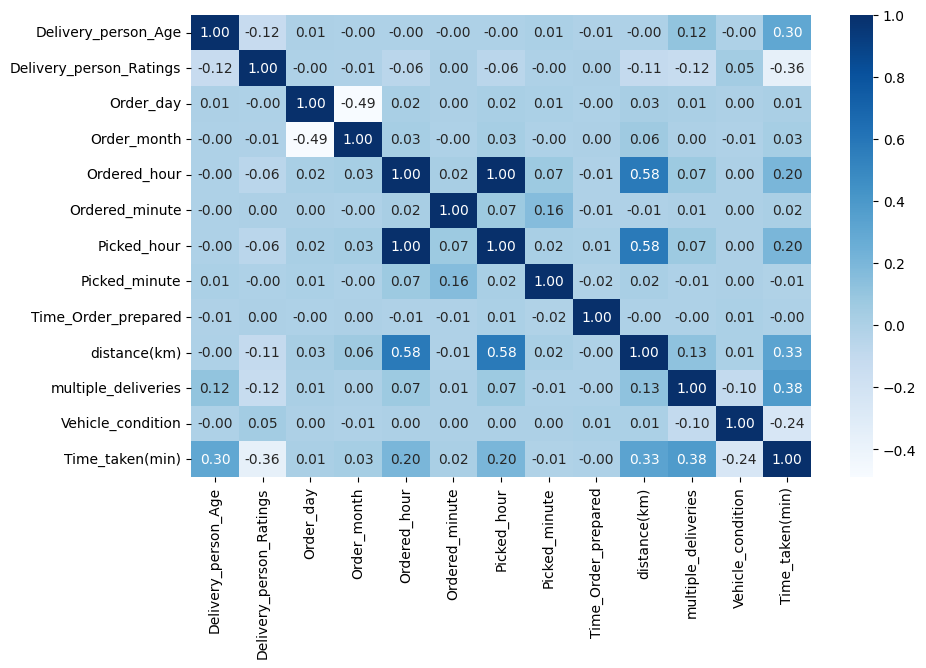

In [47]:
data_for_heatmap = df_train6[numeric_features + [target]]

correlation_matrix = data_for_heatmap.corr()

plt.figure(figsize=(10,6))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt='.2f')
plt.show()

**Plotting bar chart of categorical variables**

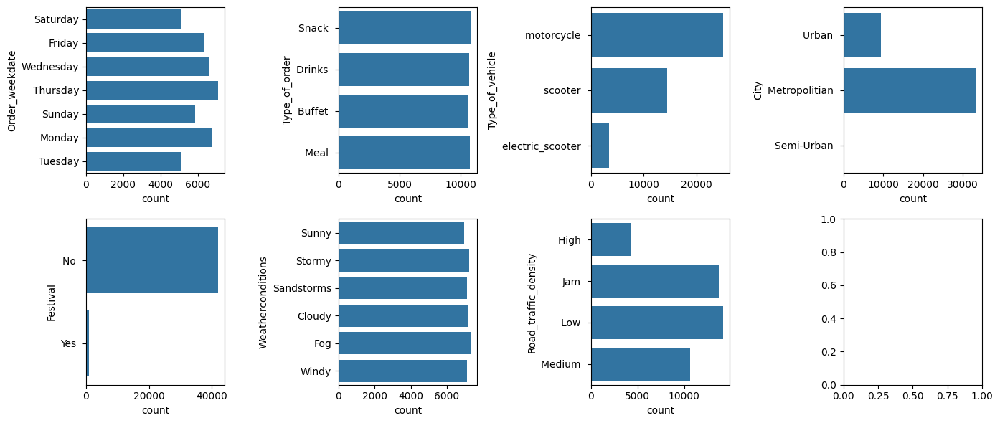

In [48]:
num_rows = (len(categorical_features) + 1) // 3

fig, axes = plt.subplots(num_rows, 4, figsize=(14, 3 * num_rows))

axes = axes.flatten()

for i, feature in enumerate(categorical_features):
    sns.countplot(data=df_train6, y=feature, ax=axes[i])

plt.tight_layout()

**Plotting distribution of target across categorical variables**

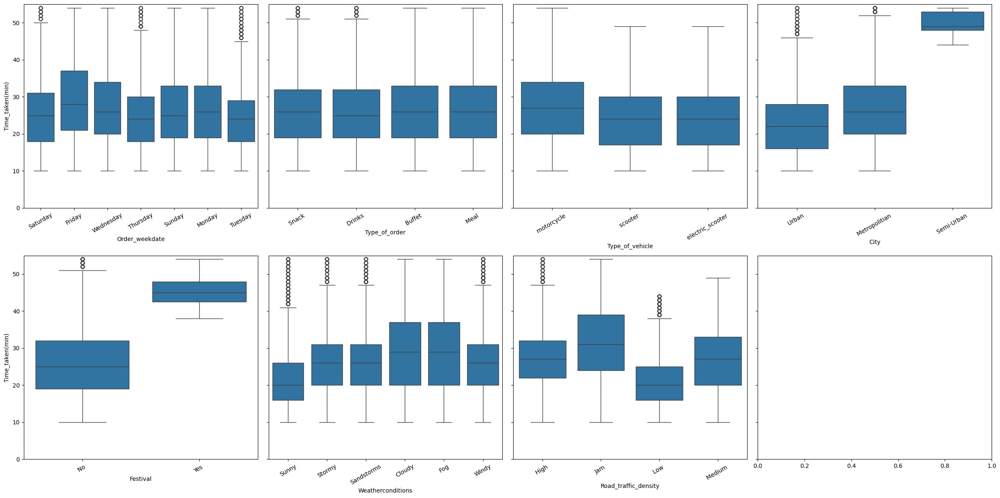

In [49]:
fig, ax = plt.subplots(2,4, figsize=(24,12), sharey=True)

row,col = 0,0

for feature in categorical_features:
    sns.boxplot(data=df_train6, x=feature, y=target, ax=ax[row,col])
    ax[row,col].set_ylim([0,55])
    xlabels = ax[row,col].get_xticklabels()
    ax[row,col].set_xticklabels(xlabels, rotation=30)

    if col < 3:
        col += 1
    else:
        row += 1
        col = 0

plt.tight_layout()
plt.show()

**3. Using Pycaret to Identify The Best Model**

In [50]:
# Setup PYCARET

# install pycaret
!pip install pycaret

# import RegressionExperiment and initiate the class

from pycaret.regression import RegressionExperiment
exp = RegressionExperiment()

# check the type of exp
type(exp)

pycaret.regression.oop.RegressionExperiment

In [51]:
# initiate setup on exp

exp.setup(df_train6, target=target, numeric_features=numeric_features, categorical_features=categorical_features, session_id=123)

,Description,Value
0,Session id,123
1,Target,Time_taken(min)
2,Target type,Regression
3,Original data shape,"(42877, 20)"
4,Transformed data shape,"(42877, 41)"
5,Transformed train set shape,"(30013, 41)"
6,Transformed test set shape,"(12864, 41)"
7,Ordinal features,1
8,Numeric features,12
9,Categorical features,7


In [52]:
# compare baseline models

best = exp.compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,3.0549,14.3536,3.7882,0.8378,0.1565,0.1328,2.3140
et,Extra Trees Regressor,3.0862,14.9228,3.8627,0.8314,0.1590,0.1336,11.6810
rf,Random Forest Regressor,3.1056,14.9760,3.8696,0.8308,0.1597,0.1346,13.1240
xgboost,Extreme Gradient Boosting,3.1423,15.3686,3.9199,0.8263,0.1613,0.1361,0.5820
gbr,Gradient Boosting Regressor,3.5239,19.2341,4.3851,0.7827,0.1830,0.1563,3.3490
dt,Decision Tree Regressor,4.0769,28.3859,5.3274,0.6793,0.2199,0.1752,0.4110
ada,AdaBoost Regressor,4.5366,30.4341,5.5166,0.6561,0.2337,0.2126,1.8500
br,Bayesian Ridge,4.7710,35.7173,5.9759,0.5964,0.2460,0.2121,0.3010
lar,Least Angle Regression,4.7710,35.7169,5.9759,0.5964,0.2460,0.2121,0.2270
ridge,Ridge Regression,4.7710,35.7169,5.9759,0.5964,0.2460,0.2121,0.2960


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

In [53]:
lightgbm_model = exp.create_model('lightgbm')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.0843,14.4791,3.8051,0.8387,0.1588,0.1347
1,3.0023,13.7865,3.7130,0.8498,0.1534,0.1305
2,3.1306,14.7272,3.8376,0.8368,0.1579,0.1355
3,3.0667,14.6646,3.8294,0.8323,0.1554,0.1314
4,3.1005,14.8706,3.8562,0.8344,0.1602,0.1357
5,3.0533,14.3744,3.7914,0.8377,0.1554,0.1324
6,3.0529,14.5403,3.8132,0.8351,0.1565,0.1320
7,3.0046,14.0904,3.7537,0.8381,0.1550,0.1303
8,2.9751,13.4750,3.6708,0.8410,0.1539,0.1305


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [55]:
tuned_lightgbm_model = exp.tune_model(lightgbm_model)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.2011,15.7787,3.9722,0.8242,0.1643,0.1396
1,3.1043,14.8408,3.8524,0.8384,0.1584,0.1349
2,3.2013,15.4606,3.9320,0.8287,0.1617,0.1389
3,3.1507,15.4448,3.9300,0.8233,0.1611,0.1363
4,3.2011,15.8702,3.9837,0.8232,0.1661,0.1410
5,3.1507,15.3776,3.9214,0.8264,0.1610,0.1374
6,3.1204,15.3906,3.9231,0.8254,0.1612,0.1354
7,3.1259,15.0763,3.8828,0.8268,0.1603,0.1361
8,3.0773,14.4558,3.8021,0.8295,0.1602,0.1357


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [56]:
holdout_pred = exp.predict_model(lightgbm_model)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,3.0422,14.2050,3.7690,0.8374,0.1539,0.1305


In [57]:
holdout_pred.head()

,Delivery_person_Age,Delivery_person_Ratings,Order_day,Order_month,Order_weekdate,Ordered_hour,Ordered_minute,Picked_hour,Picked_minute,Time_Order_prepared,...,Type_of_order,Type_of_vehicle,multiple_deliveries,City,Festival,Weatherconditions,Road_traffic_density,Vehicle_condition,Time_taken(min),prediction_label
40829,27.0,5.0,3,1,Monday,23,10,23,25,15.0,...,Snack,scooter,0.0,Urban,No,Sunny,Low,1,23,16.808991
40574,37.0,4.7,24,3,Thursday,19,25,19,30,5.0,...,Buffet,scooter,1.0,Metropolitian,No,Stormy,Jam,2,25,28.953749
31838,32.0,4.0,3,6,Friday,18,25,18,40,15.0,...,Meal,motorcycle,2.0,Metropolitian,No,Fog,Medium,1,39,39.341414
6782,26.0,4.8,15,3,Tuesday,17,35,17,50,15.0,...,Meal,scooter,1.0,Metropolitian,No,Windy,Medium,2,26,23.987344
35634,39.0,4.4,3,12,Saturday,17,50,18,5,15.0,...,Snack,electric_scooter,0.0,Metropolitian,No,Sandstorms,Medium,2,31,35.797250


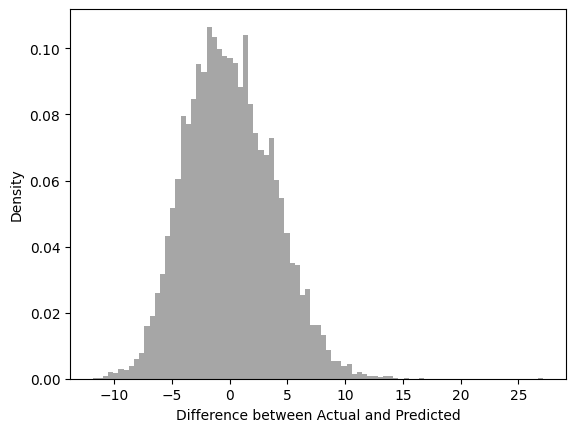

In [58]:
holdout_pred['difference'] = holdout_pred['Time_taken(min)'] - holdout_pred['prediction_label']

import matplotlib.pyplot as plt

plt.hist(holdout_pred['difference'], bins='auto', density=True, color='grey', alpha=0.7)
plt.xlabel('Difference between Actual and Predicted')
plt.ylabel('Density')
plt.show()

In [59]:
# import predict data

files.upload()

Saving predict.csv to predict.csv


{'predict.csv': b'ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City\r\n0x2318 ,COIMBRES13DEL01 ,NaN ,NaN ,11.003669,76.976494,11.043669,77.016494,30-03-2022,NaN ,15:05:00,conditions NaN,NaN ,3,Drinks ,electric_scooter ,1,No ,Metropolitian \r\n0x3474 ,BANGRES15DEL01 ,28,4.6,12.975377,77.696664,13.085377,77.806664,29-03-2022,20:30:00,20:35:00,conditions Windy,Jam ,0,Snack ,motorcycle ,1,No ,Metropolitian \r\n0x9420 ,JAPRES09DEL03 ,23,4.5,26.911378,75.789034,27.001378,75.879034,10-03-2022,19:35:00,19:45:00,conditions Stormy,Jam ,0,Drinks ,motorcycle ,1,No ,Metropolitian \r\n0x72ee ,JAPRES07DEL03 ,21,4.8,26.766536,75.837333,26.856536,75.927333,02-04-2022,17:15:00,17:20:00,conditions Fog,Medium ,1,Meal ,scooter ,1,No ,Met

**4. Cleaning the Predict Data**

In [60]:
df_predict = pd.read_csv('predict.csv')
df_predict.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City
0,0x2318,COIMBRES13DEL01,NaN,NaN,11.003669,76.976494,11.043669,77.016494,30-03-2022,NaN,15:05:00,conditions NaN,NaN,3,Drinks,electric_scooter,1,No,Metropolitian
1,0x3474,BANGRES15DEL01,28,4.6,12.975377,77.696664,13.085377,77.806664,29-03-2022,20:30:00,20:35:00,conditions Windy,Jam,0,Snack,motorcycle,1,No,Metropolitian
2,0x9420,JAPRES09DEL03,23,4.5,26.911378,75.789034,27.001378,75.879034,10-03-2022,19:35:00,19:45:00,conditions Stormy,Jam,0,Drinks,motorcycle,1,No,Metropolitian
3,0x72ee,JAPRES07DEL03,21,4.8,26.766536,75.837333,26.856536,75.927333,02-04-2022,17:15:00,17:20:00,conditions Fog,Medium,1,Meal,scooter,1,No,Metropolitian
4,0xa759,CHENRES19DEL01,31,4.6,12.986047,80.218114,13.096047,80.328114,27-03-2022,18:25:00,18:40:00,conditions Sunny,Medium,2,Drinks,scooter,1,No,Metropolitian


In [61]:
df_predict2 = transform_null(df_predict)
df_predict3 = transform_dataframe_without_target(df_predict2)
df_predict4 = transform_fill_null(df_predict3)
df_predict5 = df_predict4[columns_to_keep_without_target]
df_predict6 = transform_outliers(df_predict5)

df_predict6.head()

,Delivery_person_Age,Delivery_person_Ratings,Order_day,Order_month,Order_weekdate,Ordered_hour,Ordered_minute,Picked_hour,Picked_minute,Time_Order_prepared,distance(km),Type_of_order,Type_of_vehicle,multiple_deliveries,City,Festival,Weatherconditions,Road_traffic_density,Vehicle_condition
1,28.0,4.6,29,3,Tuesday,20,30,20,35,5.0,17.042985,Snack,motorcycle,1.0,Metropolitian,No,Windy,Jam,0
2,23.0,4.5,3,10,Monday,19,35,19,45,10.0,13.390474,Drinks,motorcycle,1.0,Metropolitian,No,Stormy,Jam,0
3,21.0,4.8,4,2,Friday,17,15,17,20,5.0,13.397932,Meal,scooter,1.0,Metropolitian,No,Fog,Medium,1
4,31.0,4.6,27,3,Sunday,18,25,18,40,15.0,17.042634,Drinks,scooter,1.0,Metropolitian,No,Sunny,Medium,2
5,26.0,4.7,15,2,Tuesday,9,45,9,55,10.0,1.541060,Drinks,motorcycle,1.0,Metropolitian,No,Fog,Low,0


**5. Make Prediction with Pycaret**

In [62]:
predictions_pycaret = exp.predict_model(lightgbm_model, data = df_predict6)
predictions_pycaret.head()

,Delivery_person_Age,Delivery_person_Ratings,Order_day,Order_month,Order_weekdate,Ordered_hour,Ordered_minute,Picked_hour,Picked_minute,Time_Order_prepared,distance(km),Type_of_order,Type_of_vehicle,multiple_deliveries,City,Festival,Weatherconditions,Road_traffic_density,Vehicle_condition,prediction_label
1,28.0,4.6,29,3,Tuesday,20,30,20,35,5.0,17.042984,Snack,motorcycle,1.0,Metropolitian,No,Windy,Jam,0,30.979767
2,23.0,4.5,3,10,Monday,19,35,19,45,10.0,13.390474,Drinks,motorcycle,1.0,Metropolitian,No,Stormy,Jam,0,30.724892
3,21.0,4.8,4,2,Friday,17,15,17,20,5.0,13.397932,Meal,scooter,1.0,Metropolitian,No,Fog,Medium,1,32.196291
4,31.0,4.6,27,3,Sunday,18,25,18,40,15.0,17.042633,Drinks,scooter,1.0,Metropolitian,No,Sunny,Medium,2,22.829384
5,26.0,4.7,15,2,Tuesday,9,45,9,55,10.0,1.541060,Drinks,motorcycle,1.0,Metropolitian,No,Fog,Low,0,18.847297


In [63]:
# Save model (pipeline)

exp.save_model(best, 'time_delivery_pred_pipeline')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(include=['Delivery_person_Age',
                                              'Delivery_person_Ratings',
                                              'Order_day', 'Order_month',
                                              'Ordered_hour', 'Ordered_minute',
                                              'Picked_hour', 'Picked_minute',
                                              'Time_Order_prepared',
                                              'distance(km)',
                                              'multiple_deliveries',
                                              'Vehicle_condition'],
                                     transformer=SimpleImputer())),
                 ('categori...
                                              'Weatherconditions',
                                              'Road_traffic_density'],
                                     trans

In [64]:
# Load pipeline

exp.load_model('time_delivery_pred_pipeline')

Transformation Pipeline and Model Successfully Loaded


Pipeline(memory=FastMemory(location=/tmp/joblib),
         steps=[('numerical_imputer',
                 TransformerWrapper(include=['Delivery_person_Age',
                                             'Delivery_person_Ratings',
                                             'Order_day', 'Order_month',
                                             'Ordered_hour', 'Ordered_minute',
                                             'Picked_hour', 'Picked_minute',
                                             'Time_Order_prepared',
                                             'distance(km)',
                                             'multiple_deliveries',
                                             'Vehicle_condition'],
                                    transformer=SimpleImputer()))...
                                             'Weatherconditions',
                                             'Road_traffic_density'],
                                    transformer=OneHotEncoder(cols=['Order_weekdate',
                                                                    'Type_of_order',
                                                                    'Type_of_vehicle',
                                                                    'City',
                                                                    'Weatherconditions',
                                                                    'Road_traffic_density'],
                                                              handle_missing='return_nan',
                                                              use_cat_names=True))),
                ('clean_column_names',
                 TransformerWrapper(transformer=CleanColumnNames())),
                ('trained_model', LGBMRegressor(n_jobs=-1, random_state=123))])

**6. Make Prediction by Manually Building a Model**

In [65]:
df_train6.head()

,Delivery_person_Age,Delivery_person_Ratings,Order_day,Order_month,Order_weekdate,Ordered_hour,Ordered_minute,Picked_hour,Picked_minute,Time_Order_prepared,distance(km),Type_of_order,Type_of_vehicle,multiple_deliveries,City,Festival,Weatherconditions,Road_traffic_density,Vehicle_condition,Time_taken(min)
0,37.0,4.9,19,3,Saturday,11,30,11,45,15.0,3.020737,Snack,motorcycle,0.0,Urban,No,Sunny,High,2,24
1,34.0,4.5,25,3,Friday,19,45,19,50,5.0,20.143737,Snack,scooter,1.0,Metropolitian,No,Stormy,Jam,2,33
2,23.0,4.4,19,3,Saturday,8,30,8,45,15.0,1.549693,Drinks,motorcycle,1.0,Urban,No,Sandstorms,Low,0,26
3,38.0,4.7,4,5,Wednesday,18,0,18,10,10.0,7.774497,Buffet,motorcycle,1.0,Metropolitian,No,Sunny,Medium,0,21
4,32.0,4.6,26,3,Saturday,13,30,13,45,15.0,6.197898,Snack,scooter,1.0,Metropolitian,No,Cloudy,High,1,30


***6.1 Data Preprocessing***

In [66]:
df_train6_copy = df_train6.copy()

# scaling numeric features

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_train6_copy[numeric_features] = scaler.fit_transform(df_train6_copy[numeric_features])

# encoding categorical features
df_train6_copy = pd.get_dummies(df_train6_copy, columns=categorical_features)

df_train6_copy.describe().T


,count,mean,std,min,25%,50%,75%,max
Delivery_person_Age,42877.0,1.218265e-15,1.000012,-1.661235,-0.791928,0.077379,0.946686,1.642131
Delivery_person_Ratings,42877.0,-1.290517e-15,1.000012,-6.864116,-0.435890,0.206933,0.849755,1.171167
Order_day,42877.0,-8.294112e-17,1.000012,-1.098147,-0.994006,0.047403,0.776390,1.921941
Order_month,42877.0,-1.259446e-16,1.000012,-1.114509,-0.429693,-0.429693,0.255123,2.651979
Ordered_hour,42877.0,3.562905e-17,1.000012,-3.606809,-0.482310,0.350889,0.767489,1.184089
Ordered_minute,42877.0,-7.063667e-17,1.000012,-1.768451,-0.857881,0.052688,0.963258,1.570305
Picked_hour,42877.0,1.915683e-16,1.000012,-3.641611,-0.516963,0.316276,0.732896,1.149515
Picked_minute,42877.0,4.408060e-17,1.000012,-1.676569,-0.812756,0.051057,0.914871,1.490746
Time_Order_prepared,42877.0,1.261931e-16,1.000012,-1.212760,-1.212760,0.010787,1.234334,1.234334
distance(km),42877.0,2.320031e-18,1.000012,-1.465951,-0.897291,-0.088756,0.711540,2.011925


***6.2 Feature Engineering***

In [67]:
# Splitting the Data:

from sklearn.model_selection import train_test_split

X = df_train6_copy.drop('Time_taken(min)', axis=1)
y = df_train6_copy['Time_taken(min)']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

***6.3 Training Model: LightGBM***

In [68]:
# Building and Training the LightGBM Model

import lightgbm as lgb

X_train.columns = X_train.columns.str.replace(' ', '_')
X_test.columns = X_test.columns.str.replace(' ', '_')

# Create a LightGBM dataset
train_data = lgb.Dataset(X_train, label=y_train)

# Define model parameters
params = {
    'objective': 'regression',
    'metric': 'rmse',
    'boosting_type': 'gbdt',
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': 0
}

# Train the model
model = lgb.train(params, train_data, num_boost_round=100)

In [69]:
# Making Predictions

y_pred = model.predict(X_test)

***6.4 Evaluating Model Performance***

In [70]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Calculate MAE, MSE, RMSE, and R2
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error (MAE): {mae}')
print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R2): {r2}')


Mean Absolute Error (MAE): 3.0849262397640835
Mean Squared Error (MSE): 14.655626739383102
Root Mean Squared Error (RMSE): 3.8282668061909035
R-squared (R2): 0.8371858180028914


***6.5 Fine-Tuning Model***

In [71]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'num_leaves': [20, 31, 40],
    'learning_rate': [0.01, 0.05, 0.1],
}

# Create a LightGBM estimator (not a trained model)
base_model = lgb.LGBMRegressor()

# Create GridSearchCV with the LightGBM estimator
grid_search = GridSearchCV(estimator=base_model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=10)

# Fit the model
grid_search.fit(X_train, y_train)

# Get the best parameters and the best model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 472
[LightGBM] [Info] Number of data points in the train set: 30870, number of used features: 41
[LightGBM] [Info] Start training from score 26.354908
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 472
[LightGBM] [Info] Number of data points in the train set: 30871, number of used features: 41
[LightGBM] [Info] Start training from score 26.366169
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003339 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bi

In [72]:
# Print the best parameters
print("Best Parameters:", best_params)

Best Parameters: {'learning_rate': 0.1, 'num_leaves': 40}


In [73]:
# Making Predictions

best_y_pred = best_model.predict(X_test)

In [74]:
# Evaluating Model Performance

# Calculate MAE, MSE, RMSE, and R2
mae = mean_absolute_error(y_test, best_y_pred)
mse = mean_squared_error(y_test, best_y_pred)
rmse = mean_squared_error(y_test, best_y_pred, squared=False)
r2 = r2_score(y_test, best_y_pred)

print(f'Mean Absolute Error (MAE): {mae}')
print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R2): {r2}')

Mean Absolute Error (MAE): 3.025632736939958
Mean Squared Error (MSE): 14.085779195460123
Root Mean Squared Error (RMSE): 3.753102609236806
R-squared (R2): 0.8435164419589152


***6.6 Feature Engineering (Predict Data)***

In [75]:
# Preprocess predict data

df_predict6_copy = df_predict6.copy()

# scaling numeric features

scaler = StandardScaler()
df_predict6_copy[numeric_features] = scaler.fit_transform(df_predict6_copy[numeric_features])

# encoding categorical features
df_predict6_copy = pd.get_dummies(df_predict6_copy, columns=categorical_features)

df_predict6_copy.describe().T

,count,mean,std,min,25%,50%,75%,max
Delivery_person_Age,10716.0,8.641422e-16,1.000047,-1.656649,-0.785009,0.001285,0.783945,1.655586
Delivery_person_Ratings,10716.0,1.664298e-16,1.000047,-6.638265,-0.419695,0.202162,0.824019,1.134947
Order_day,10716.0,3.713176e-17,1.000047,-1.107260,-1.003466,0.034472,0.761029,1.902760
Order_month,10716.0,8.222032e-17,1.000047,-1.110301,-0.422616,-0.422616,0.265069,2.671969
Ordered_hour,10716.0,1.644406e-16,1.000047,-3.598931,-0.485561,0.344671,0.759787,1.174903
Ordered_minute,10716.0,-9.349247e-17,1.000047,-1.768581,-0.854286,0.060009,0.974304,1.583834
Picked_hour,10716.0,-2.738467e-16,1.000047,-3.635631,-0.520107,0.310700,0.726103,1.141506
Picked_minute,10716.0,-1.657668e-18,1.000047,-1.686735,-0.818438,0.049859,0.918156,1.497021
Time_Order_prepared,10716.0,-1.339396e-16,1.000047,-1.226289,-1.226289,-0.001372,1.223546,1.223546
distance(km),10716.0,-3.514256e-17,1.000047,-1.469664,-0.899874,-0.089761,0.703485,2.015117


***6.7 Making Prediction***

In [76]:
prediction_normal = best_model.predict(df_predict6_copy)

prediction_normal

array([30.82755317, 30.87547905, 30.77581446, ..., 28.95684439,
       27.21641537, 23.62710999])

In [79]:
# save model
import joblib

# Save the best_model
joblib.dump(best_model, 'best_model.joblib')

# Save the best_params dictionary for reference
joblib.dump(grid_search.best_params_, 'best_params.joblib')

['best_params.joblib']

In [80]:
# Load the saved model
loaded_model = joblib.load('best_model.joblib')

# Load the best_params dictionary
loaded_best_params = joblib.load('best_params.joblib')

***6.8 Compare Pycaret and Normal Method***

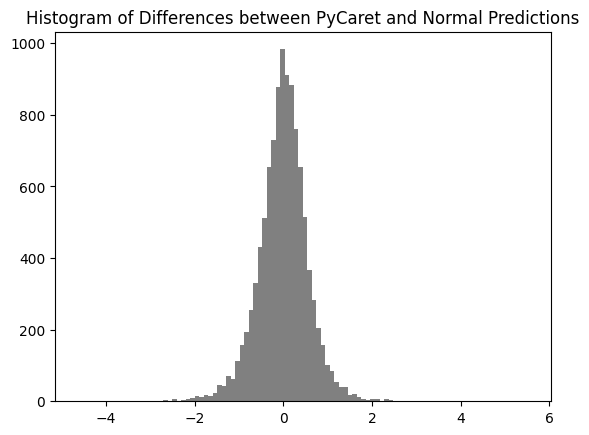

In [78]:
compare_result_pycaret_normal = predictions_pycaret['prediction_label'] - prediction_normal

plt.hist(compare_result_pycaret_normal, bins=100, color='grey')
plt.title('Histogram of Differences between PyCaret and Normal Predictions')
plt.show()